In [1]:
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()
%matplotlib inline

def load_data(filename):
    """
    Funzione per il parsing di una serie intraday 
    con estensione txt esportata da Tradestation
    """
    data = pd.read_csv(filename, 
                       usecols=['Date','Time','Open','High','Low','Close','Up','Down'], 
                       parse_dates=[['Date', 'Time']], )
    data.columns = ["date_time","open","high","low","close","up","down"]
    data.set_index('date_time', inplace = True)
    data['volume'] = data['up'] + data['down']
    data.drop(['up','down'], axis=1, inplace=True)
    return data

filename = "@ES_60min_Exchange.txt"
dataset = load_data(filename)
dataset["hour"] = dataset.index.hour
dataset[-39:-16]

,open,high,low,close,volume,hour
date_time,,,,,,
2019-11-14 01:00:00,3092.75,3092.75,3090.00,3090.25,6559,1
2019-11-14 02:00:00,3090.50,3093.25,3087.50,3092.00,18396,2
2019-11-14 03:00:00,3092.00,3093.50,3088.50,3090.00,19955,3
2019-11-14 04:00:00,3090.00,3091.75,3087.50,3090.50,16250,4
2019-11-14 05:00:00,3090.75,3096.75,3090.25,3091.75,18881,5
2019-11-14 06:00:00,3091.75,3092.75,3089.00,3092.75,10704,6
2019-11-14 07:00:00,3092.75,3093.50,3089.25,3090.75,12552,7
2019-11-14 08:00:00,3091.00,3091.50,3087.25,3089.00,19837,8
2019-11-14 09:00:00,3089.25,3093.00,3087.75,3093.00,96161,9


In [2]:
dataset.iplot(kind='candle',theme='white',
              up_color='green', down_color='red',
              title = "Copper Continuous Futures [HG]", xTitle = "Tempo", yTitle = "Prezzo")

In [3]:
dataset.tail(200).iplot(kind='candle',theme='white',
                        up_color='green', down_color='red',
                        title = "Copper Continuous Futures [HG]", xTitle = "Tempo", yTitle = "Prezzo")

Filtriamo per esempio tutti i record alle ore 0 e visualizziamo i primi 10:

In [4]:
dataset[(dataset.hour == 0)].volume.head(10)

date_time
2001-02-12     0
2001-05-14    17
2001-05-15    95
2001-05-16    44
2001-05-17    35
2001-05-18    32
2001-05-21    15
2001-05-22    17
2001-05-23    13
2001-05-24    63
Name: volume, dtype: int64

In [5]:
round(dataset[(dataset.hour == 0)].volume.mean(),2)

2677.29

In [6]:
dataset[(dataset.hour == 0)].volume.count()

4748

In [7]:
hours = []

for hour in range(0,24):
    hours.append(hour)
    
print(hours)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]


In [8]:
activity = []

for hour in hours:
    activity.append(round(dataset[(dataset.hour == hour)].volume.mean(),2))
    
activity

[2677.29,
 3055.53,
 6672.7,
 17192.05,
 13781.22,
 12015.91,
 12222.42,
 17680.84,
 37824.18,
 167474.38,
 218871.05,
 151404.92,
 105444.83,
 100191.48,
 130472.14,
 207567.32,
 68253.89,
 nan,
 5247.77,
 3648.65,
 5248.62,
 4954.76,
 3926.38,
 3368.87]

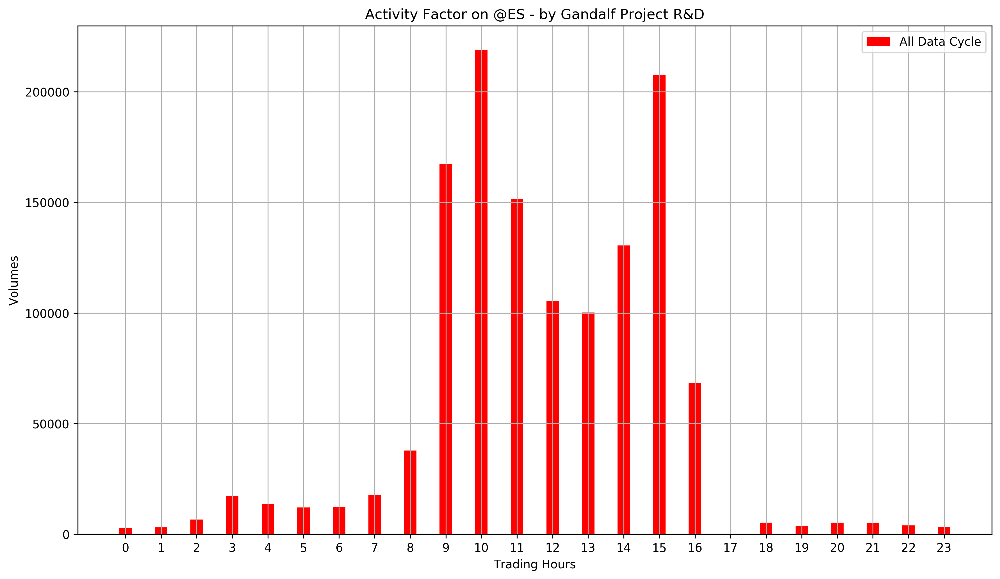

In [9]:
# MODULO GRAFICO **************************************
n_groups = 24

fig, ax = plt.subplots(figsize=(14, 8), dpi=300)

index = np.arange(n_groups)
bar_width = 0.35
opacity = 1

rects1 = ax.bar(index, 
                activity, 
                bar_width,
                alpha=opacity,
                color='red',
                label='All Data Cycle')

ax.set_xlabel('Trading Hours')
ax.set_ylabel('Volumes')
ax.set_title('Activity Factor on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))
ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************

In [10]:
def normalizeMinMax(array):
    """
    Funzione per normalizzare un array
    che porta a 0 il valore minimo
    e ad 1 il valore massimo
    (a[i] - min(a))/(max(a)-min(a)) 
    """
    normalized_array = []
    for elements in array:
        normalized_array.append((elements - min(array))/(max(array)-min(array)))
    return normalized_array

def normalizeMax(array):
    """
    Funzione per normalizzare un array
    che porta ad 1 il valore massimo
    a[i]/max(a)
    """
    normalized_array = []
    for elements in array:
        normalized_array.append(elements / max(array))
    return normalized_array

normalize = True
    
if normalize == True:
    activity = normalizeMax(activity)

activity

[0.012232271010716127,
 0.01396041184980837,
 0.030486900848696073,
 0.0785487619308264,
 0.06296501981417826,
 0.054899494474029344,
 0.05584301806931525,
 0.0807819946950499,
 0.17281490631127325,
 0.7651737404284396,
 1.0,
 0.6917539802545838,
 0.4817669125268052,
 0.4577648802799639,
 0.5961141960071924,
 0.9483543849220809,
 0.3118452166241264,
 nan,
 0.023976537783320366,
 0.01667031797946782,
 0.023980421348552036,
 0.022637804314458217,
 0.017939238652165283,
 0.015392031061211613]

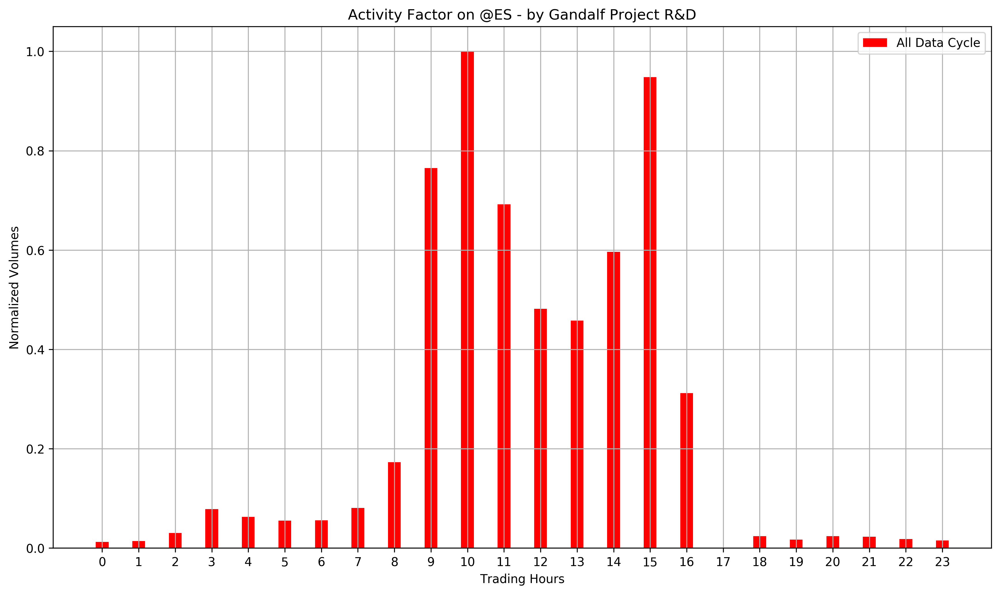

In [11]:
# MODULO GRAFICO **************************************
n_groups = 24

fig, ax = plt.subplots(figsize=(14, 8), dpi=300)

index = np.arange(n_groups)
bar_width = 0.35
opacity = 1

rects1 = ax.bar(index, 
                activity, 
                bar_width,
                alpha=opacity,
                color='red',
                label='All Data Cycle')

ax.set_xlabel('Trading Hours')
if normalize == True:
    ax.set_ylabel('Normalized Volumes')
else:
    ax.set_ylabel('Volumes')
ax.set_title('Activity Factor on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))
ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************

### Ripetendo l'analisi su tre periodi temporali differenti:

In [12]:
dataset = load_data(filename)
dataset["hour"] = dataset.index.hour
dataset.head()

,open,high,low,close,volume,hour
date_time,,,,,,
2000-01-03 01:00:00,1530.75,1530.75,1529.00,1529.75,12,1
2000-01-03 02:00:00,1529.75,1531.25,1529.75,1531.00,20,2
2000-01-03 03:00:00,1530.75,1538.50,1530.50,1535.25,82,3
2000-01-03 04:00:00,1535.00,1537.75,1534.75,1537.25,34,4
2000-01-03 05:00:00,1537.50,1540.75,1537.25,1539.00,44,5


In [13]:
dataset.index.min()

Timestamp('2000-01-03 01:00:00')

In [14]:
dataset.index.max()

Timestamp('2019-11-15 16:00:00')

In [22]:
#******* INPUT *********************************

filename = "@ES_60min_Exchange.txt"

startDateLong = "20000101"
endDateLong = "20191117"

startDateMid = "20091117"
endDateMid = "20191117"

startDateShort = "20181117"
endDateShort = "20191117"

normalize = True

#******* INPUT *********************************

In [23]:
startDateLongParsed = datetime.date(int(startDateLong[0:4]), int(startDateLong[4:6]), int(startDateLong[6:]))
endDateLongParsed = datetime.date(int(endDateLong[0:4]), int(endDateLong[4:6]), int(endDateLong[6:]))

startDateMidParsed = datetime.date(int(startDateMid[0:4]), int(startDateMid[4:6]), int(startDateMid[6:]))
endDateMidParsed = datetime.date(int(endDateMid[0:4]), int(endDateMid[4:6]), int(endDateMid[6:]))

startDateShortParsed = datetime.date(int(startDateShort[0:4]), int(startDateShort[4:6]), int(startDateShort[6:]))
endDateShortParsed = datetime.date(int(endDateShort[0:4]), int(endDateShort[4:6]), int(endDateShort[6:]))

instrument_Long = dataset.loc[startDateLongParsed:endDateLongParsed]
instrument_Mid = dataset.loc[startDateMidParsed:endDateMidParsed]
instrument_Short = dataset.loc[startDateShortParsed:endDateShortParsed]

activity_long = []
activity_mid = []
activity_short = []

hours = []
for hour in range(0,24):
    hours.append(hour)

for hour in hours:
    activity_long.append(round(instrument_Long[(instrument_Long.hour == hour)].volume.mean(),2))
    activity_mid.append(round(instrument_Mid[(instrument_Mid.hour == hour)].volume.mean(),2))
    activity_short.append(round(instrument_Short[(instrument_Short.hour == hour)].volume.mean(),2))
    
if normalize == True:
    activity_long = normalizeMax(activity_long)
    activity_mid = normalizeMax(activity_mid)
    activity_short = normalizeMax(activity_short)

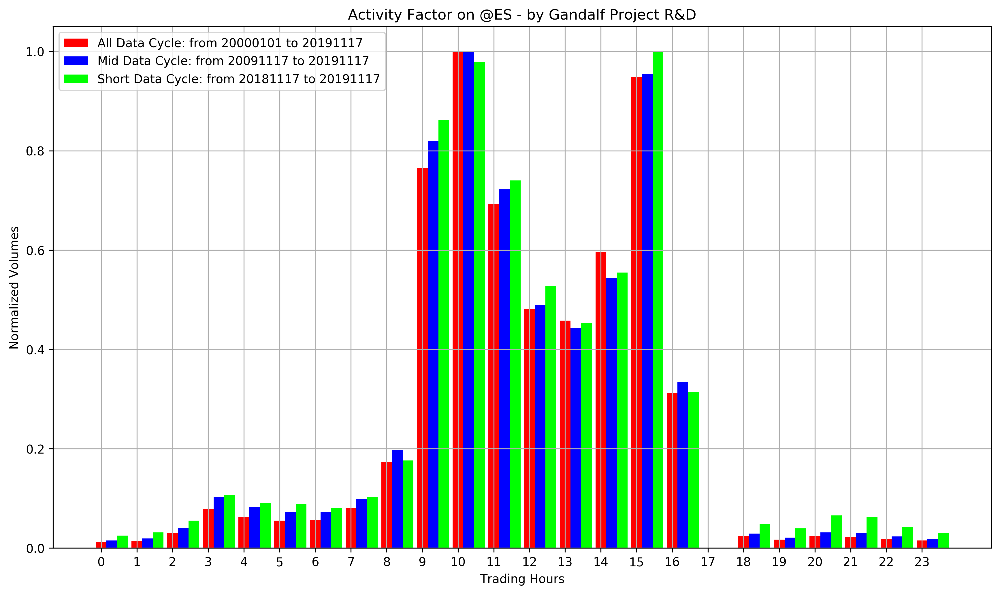

In [24]:
# MODULO GRAFICO **************************************
n_groups = 24
fig, ax = plt.subplots(figsize=(14, 8), dpi=300)
index = np.arange(n_groups)
bar_width = 0.30
opacity = 1

label_all = "All Data Cycle: from " + startDateLong + " to " + endDateLong
label_mid = "Mid Data Cycle: from " + startDateMid + " to " + endDateMid
label_short = "Short Data Cycle: from " + startDateShort + " to " + endDateShort

rects1 = plt.bar(index, 
                 activity_long, 
                 bar_width,
                 alpha=opacity,
                 color='red',
                 label=label_all)
rects2 = plt.bar(index + bar_width, 
                 activity_mid, 
                 bar_width,
                 alpha=opacity,
                 color='blue',
                 label=label_mid)
rects3 = plt.bar(index + 2 * bar_width, 
                 activity_short, 
                 bar_width,
                 alpha=opacity,
                 color='lime',
                 label=label_short)

ax.set_xlabel('Trading Hours')
if normalize == True:
    ax.set_ylabel('Normalized Volumes')
else:
    ax.set_ylabel('Volumes')
ax.set_title('Activity Factor on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))
ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************